## Validate INSPIRE's gene imputation capability

### Import packages

In [1]:
import pandas as pd
import numpy as np
import scanpy as sc
import anndata as ad
import umap
import os
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib.cm import get_cmap
from matplotlib.lines import Line2D

import INSPIRE
from sklearn.neighbors import NearestNeighbors
from scipy import stats

import warnings
warnings.filterwarnings("ignore")

In [2]:
print("Load seqFISH data...")

data_dir = "data/seqFISH_mouse_embryo"
counts = pd.read_csv(data_dir+"/counts.csv", index_col=0)
metadata = pd.read_csv(data_dir+"/metadata.csv", index_col=0)
metadata = metadata.loc[counts.index, :]
adata_seqfish = ad.AnnData(np.array(counts.values))
adata_seqfish.var.index = counts.columns
adata_seqfish.obs = metadata

adata_seqfish = adata_seqfish[adata_seqfish.obs["embryo"] == "embryo2", ]
adata_seqfish = adata_seqfish[adata_seqfish.obs["celltype_mapped_refined"] != "Low quality", ]
adata_seqfish.obsm["spatial"] = np.array(adata_seqfish.obs[["x_global", "y_global"]])
adata_seqfish.var_names_make_unique()

Load seqFISH data...


In [3]:
print("Load Stereo-seq data...")

data_dir = "data/Stereoseq_mouse_embryo"
adata_stereoseq = sc.read_h5ad(os.path.join(data_dir, "E9.5_E1S1.MOSTA.h5ad"))
adata_stereoseq.X = adata_stereoseq.layers['count']
adata_stereoseq.var_names_make_unique()

Load Stereo-seq data...


### Manually hold out six marker genes from the seqFISH dataset

In [4]:
gene_impu_list = ["Ttn","Popdc2",
                  "Six3","Lhx2",
                  "Foxa1","Cldn4"]
adata_seqfish = adata_seqfish[:, ~(adata_seqfish.var.index).isin(gene_impu_list)]

### Run INSPIRE model

In [5]:
adata_st_list = [adata_seqfish, adata_stereoseq]

Get shared genes among all datasets...
Find 341 shared genes among datasets.
Finding highly variable genes...
shape of adata 0 before quality control:  (14185, 341)
shape of adata 0 after quality control:  (14185, 341)
shape of adata 1 before quality control:  (5913, 341)
shape of adata 1 after quality control:  (5880, 338)
Find 338 shared highly variable genes among datasets.
Concatenate datasets as a full anndata for better visualization...


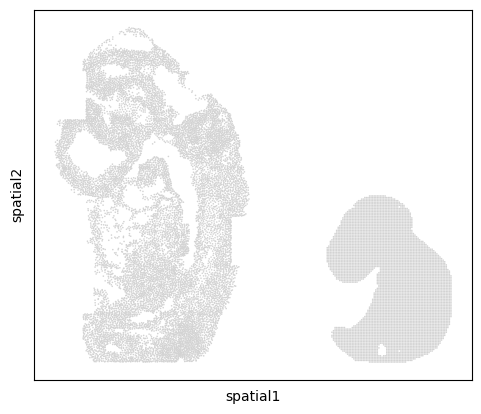

Store counts and library sizes for Poisson modeling...
Normalize data...


In [6]:
adata_st_list, adata_full = INSPIRE.utils.preprocess(adata_st_list=adata_st_list,
                                                     num_hvgs=1000,
                                                     min_genes_qc=2,
                                                     min_cells_qc=2,
                                                     spot_size=1,
                                                     limit_num_genes=True)

In [7]:
adata_st_list = INSPIRE.utils.build_graph_LGCN(adata_st_list=adata_st_list, 
                                               rad_cutoff_list=[3,1.6])

Start building graphs...
Build graphs and prepare node features for LGCN networks
Radius for graph connection is 3.0000.
26.7748 neighbors per cell on average.
Node features for slice 0 : (14185, 676)
Radius for graph connection is 1.6000.
7.7946 neighbors per cell on average.
Node features for slice 1 : (5880, 676)


In [9]:
model = INSPIRE.model.Model_LGCN(adata_st_list=adata_st_list,
                                 n_spatial_factors=40,
                                 n_training_steps=10000,
                                 batch_size=2048,
                                 different_platforms=True
                                )

In [10]:
model.train(adata_st_list)

  0%|          | 6/10000 [00:00<07:39, 21.75it/s]

Step: 0, d_loss: 1.3795, Loss: 1321.7115, recon_loss: 542.4070, fe_loss: 44.9862, geom_loss: 90.0650, beta_loss: 731.7576, gan_loss: 0.7594


  5%|▌         | 506/10000 [00:11<03:35, 44.06it/s]

Step: 500, d_loss: 0.8025, Loss: 1156.2062, recon_loss: 421.9512, fe_loss: 27.9413, geom_loss: 87.9538, beta_loss: 702.2742, gan_loss: 2.2805


 10%|█         | 1006/10000 [00:23<03:25, 43.77it/s]

Step: 1000, d_loss: 0.4605, Loss: 1068.0687, recon_loss: 333.6890, fe_loss: 27.3233, geom_loss: 116.7123, beta_loss: 701.7334, gan_loss: 2.9888


 15%|█▌        | 1506/10000 [00:34<03:14, 43.77it/s]

Step: 1500, d_loss: 0.2192, Loss: 1008.2529, recon_loss: 273.7039, fe_loss: 26.8178, geom_loss: 114.6153, beta_loss: 701.7894, gan_loss: 3.6494


 20%|██        | 2006/10000 [00:46<03:05, 43.12it/s]

Step: 2000, d_loss: 0.1613, Loss: 967.1715, recon_loss: 232.4665, fe_loss: 26.5373, geom_loss: 112.0043, beta_loss: 701.9185, gan_loss: 4.0092


 25%|██▌       | 2506/10000 [00:57<02:51, 43.78it/s]

Step: 2500, d_loss: 0.1505, Loss: 944.4811, recon_loss: 209.6136, fe_loss: 26.3871, geom_loss: 108.8623, beta_loss: 702.3289, gan_loss: 3.9742


 30%|███       | 3006/10000 [01:08<02:39, 43.93it/s]

Step: 3000, d_loss: 0.1095, Loss: 923.7773, recon_loss: 189.4411, fe_loss: 26.2072, geom_loss: 102.6299, beta_loss: 701.8252, gan_loss: 4.2512


 35%|███▌      | 3506/10000 [01:20<02:28, 43.63it/s]

Step: 3500, d_loss: 0.1584, Loss: 917.2579, recon_loss: 183.0217, fe_loss: 26.1698, geom_loss: 101.2249, beta_loss: 702.1776, gan_loss: 3.8644


 40%|████      | 4006/10000 [01:31<02:18, 43.42it/s]

Step: 4000, d_loss: 0.2182, Loss: 907.8060, recon_loss: 173.1643, fe_loss: 25.9905, geom_loss: 97.4785, beta_loss: 702.0744, gan_loss: 4.6273


 45%|████▌     | 4506/10000 [01:43<02:06, 43.55it/s]

Step: 4500, d_loss: 0.1375, Loss: 908.1998, recon_loss: 174.0829, fe_loss: 26.0043, geom_loss: 96.0484, beta_loss: 701.9686, gan_loss: 4.2229


 50%|█████     | 5006/10000 [01:54<01:53, 43.91it/s]

Step: 5000, d_loss: 0.1430, Loss: 899.9315, recon_loss: 165.3609, fe_loss: 25.9882, geom_loss: 97.4602, beta_loss: 702.3676, gan_loss: 4.2655


 55%|█████▌    | 5506/10000 [02:06<01:43, 43.60it/s]

Step: 5500, d_loss: 0.1414, Loss: 902.2596, recon_loss: 168.4683, fe_loss: 26.0173, geom_loss: 95.1445, beta_loss: 702.0005, gan_loss: 3.8708


 60%|██████    | 6006/10000 [02:17<01:31, 43.57it/s]

Step: 6000, d_loss: 0.1390, Loss: 896.6946, recon_loss: 163.0165, fe_loss: 26.0981, geom_loss: 95.9430, beta_loss: 701.5847, gan_loss: 4.0764


 65%|██████▌   | 6506/10000 [02:28<01:20, 43.66it/s]

Step: 6500, d_loss: 0.1373, Loss: 900.0043, recon_loss: 166.5816, fe_loss: 26.0880, geom_loss: 90.4565, beta_loss: 701.6263, gan_loss: 3.8992


 70%|███████   | 7006/10000 [02:40<01:08, 43.71it/s]

Step: 7000, d_loss: 0.1537, Loss: 891.6824, recon_loss: 158.5278, fe_loss: 26.0307, geom_loss: 84.9429, beta_loss: 701.6106, gan_loss: 3.8145


 75%|███████▌  | 7506/10000 [02:51<00:56, 44.05it/s]

Step: 7500, d_loss: 0.1679, Loss: 890.1442, recon_loss: 157.1890, fe_loss: 26.0339, geom_loss: 79.0926, beta_loss: 701.7827, gan_loss: 3.5568


 80%|████████  | 8006/10000 [03:03<00:45, 43.62it/s]

Step: 8000, d_loss: 0.1658, Loss: 890.5060, recon_loss: 157.4647, fe_loss: 26.0632, geom_loss: 77.6348, beta_loss: 701.8259, gan_loss: 3.5995


 85%|████████▌ | 8506/10000 [03:14<00:34, 43.89it/s]

Step: 8500, d_loss: 0.1681, Loss: 884.7556, recon_loss: 152.1146, fe_loss: 26.0144, geom_loss: 74.2172, beta_loss: 701.6224, gan_loss: 3.5198


 90%|█████████ | 9006/10000 [03:26<00:22, 43.68it/s]

Step: 9000, d_loss: 0.1876, Loss: 883.9437, recon_loss: 151.1153, fe_loss: 26.0072, geom_loss: 71.4386, beta_loss: 701.7946, gan_loss: 3.5979


 95%|█████████▌| 9506/10000 [03:37<00:11, 43.29it/s]

Step: 9500, d_loss: 0.2141, Loss: 883.6108, recon_loss: 151.2731, fe_loss: 26.0157, geom_loss: 70.0425, beta_loss: 701.3918, gan_loss: 3.5293


100%|██████████| 10000/10000 [03:48<00:00, 43.68it/s]


In [11]:
adata_full, basis_df = model.eval(adata_st_list, adata_full)
basis = np.array(basis_df.values)

Add cell/spot proportions of spatial factors into adata_full.obs...
Add cell/spot latent representations into adata_full.obsm['latent']...


### Analysis of cell representations and spatial factors

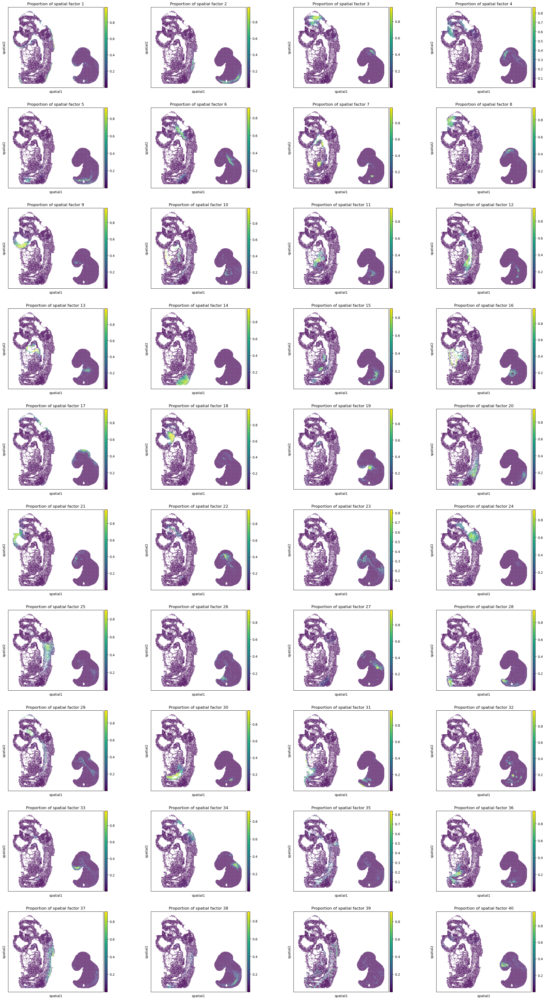

In [12]:
sc.pl.spatial(adata_full, color=["Proportion of spatial factor "+str(i+1) for i in range(40)], spot_size=1.)

In [13]:
reducer = umap.UMAP(n_neighbors=30,
                    n_components=2,
                    metric="correlation",
                    n_epochs=None,
                    learning_rate=1.0,
                    min_dist=0.3,
                    spread=1.0,
                    set_op_mix_ratio=1.0,
                    local_connectivity=1,
                    repulsion_strength=1,
                    negative_sample_rate=5,
                    a=None,
                    b=None,
                    random_state=1234,
                    metric_kwds=None,
                    angular_rp_forest=False,
                    verbose=True)
embedding = reducer.fit_transform(adata_full.obsm['latent'])
adata_full.obsm["X_umap"] = embedding
adata_full.obs["slice"] = adata_full.obs["slice"].values.astype(str)

UMAP(angular_rp_forest=True, local_connectivity=1, metric='correlation', min_dist=0.3, n_neighbors=30, random_state=1234, repulsion_strength=1, verbose=True)
Tue Aug 27 10:57:01 2024 Construct fuzzy simplicial set
Tue Aug 27 10:57:01 2024 Finding Nearest Neighbors
Tue Aug 27 10:57:01 2024 Building RP forest with 12 trees
Tue Aug 27 10:57:05 2024 NN descent for 14 iterations
	 1  /  14
	 2  /  14
	 3  /  14
	Stopping threshold met -- exiting after 3 iterations
Tue Aug 27 10:57:13 2024 Finished Nearest Neighbor Search
Tue Aug 27 10:57:15 2024 Construct embedding


Epochs completed:   0%|            0/200 [00:00]

	completed  0  /  200 epochs
	completed  20  /  200 epochs
	completed  40  /  200 epochs
	completed  60  /  200 epochs
	completed  80  /  200 epochs
	completed  100  /  200 epochs
	completed  120  /  200 epochs
	completed  140  /  200 epochs
	completed  160  /  200 epochs
	completed  180  /  200 epochs
Tue Aug 27 10:57:35 2024 Finished embedding


In [14]:
# clustering
sc.pp.neighbors(adata_full, use_rep="latent", n_neighbors=30)
sc.tl.louvain(adata_full, resolution=.9)

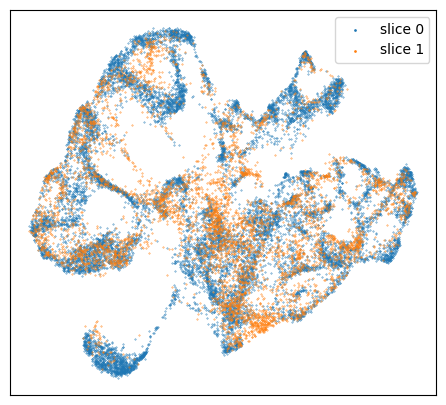

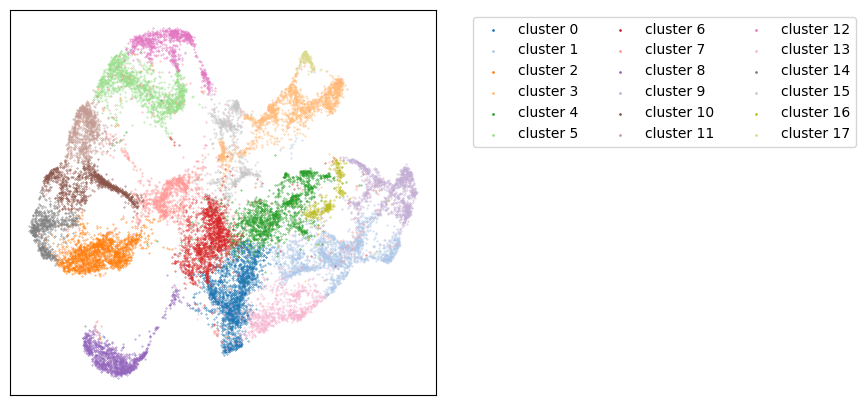

In [15]:
# visualize umaps
size = .1

rgb_10 = [i for i in get_cmap('Set3').colors]
rgb_20 = [i for i in get_cmap('tab20').colors]
rgb_20b = [i for i in get_cmap('tab20b').colors]
rgb_dark2 = [i for i in get_cmap('Dark2').colors]
rgb_pst1 = [i for i in get_cmap('Pastel1').colors]
rgb_acc = [i for i in get_cmap('Accent').colors]
rgb2hex_10 = [mpl.colors.rgb2hex(color) for color in rgb_10]
rgb2hex_20 = [mpl.colors.rgb2hex(color) for color in rgb_20]
rgb2hex_20b = [mpl.colors.rgb2hex(color) for color in rgb_20b]
rgb2hex_20b_new = [rgb2hex_20b[i] for i in [0, 3, 4, 7, 8, 11, 12, 15, 16, 19]]
rgb2hex_dark2 = [mpl.colors.rgb2hex(color) for color in rgb_dark2]
rgb2hex_pst1 = [mpl.colors.rgb2hex(color) for color in rgb_pst1]
rgb2hex_acc = [mpl.colors.rgb2hex(color) for color in rgb_acc]
rgb2hex = rgb2hex_20 + rgb2hex_20b_new + rgb2hex_dark2 + rgb2hex_pst1 + rgb2hex_acc

embedding = adata_full.obsm["X_umap"]

# umap, slice
f = plt.figure(figsize=(5.5,5))
ax = f.add_subplot(1,1,1)
colors = ["tab:blue", "tab:orange"]
for i in range(len(set(adata_full.obs["slice"]))):
    ax.scatter(embedding[adata_full.obs["slice"]==str(i), 0], embedding[adata_full.obs["slice"]==str(i), 1], 
               s=size, c=colors[i], label="slice "+str(i))
ax.tick_params(axis='both',bottom=False, top=False, left=False, right=False, labelleft=False, labelbottom=False, grid_alpha=0)
plt.legend(markerscale=3)
plt.show()

# umap, louvain
f = plt.figure(figsize=(5.5,5))
ax = f.add_subplot(1,1,1)
n_louvain = len(set(adata_full.obs["louvain"]))
colors = rgb2hex
for i in range(n_louvain):
    ax.scatter(embedding[adata_full.obs["louvain"].values.astype(str)==str(i), 0], 
               embedding[adata_full.obs["louvain"].values.astype(str)==str(i), 1], 
               s=size, c=colors[i], label="cluster "+str(i))
ax.tick_params(axis='both',bottom=False, top=False, left=False, right=False, labelleft=False, labelbottom=False, grid_alpha=0)
plt.legend(markerscale=3, ncol=3, bbox_to_anchor=(2,1))
plt.show()

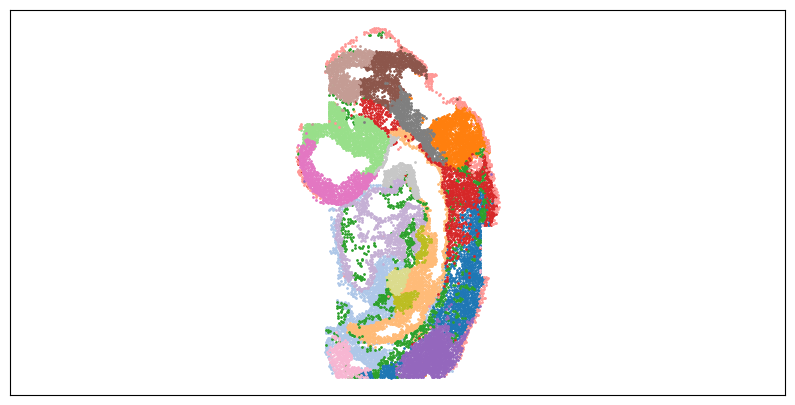

In [16]:
size = 1

# louvain
f = plt.figure(figsize=(10,5))
ax = f.add_subplot(1,1,1)
ax.axis('equal')
colors = rgb2hex
adata_tmp = adata_full[:adata_st_list[0].shape[0], :]
for i in range(n_louvain):
    ax.scatter(adata_tmp.obsm["spatial"][adata_tmp.obs["louvain"].values.astype(str)==str(i), 0], 
               -adata_tmp.obsm["spatial"][adata_tmp.obs["louvain"].values.astype(str)==str(i), 1], 
               s=size, c=colors[i], label="cluster "+str(i))
ax.tick_params(axis='both',bottom=False, top=False, left=False, right=False, labelleft=False, labelbottom=False, grid_alpha=0)

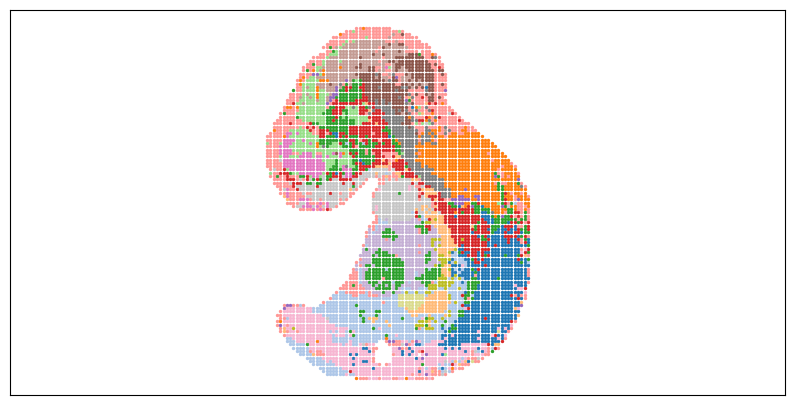

In [17]:
size = 2.

# louvain
f = plt.figure(figsize=(10,5))
ax = f.add_subplot(1,1,1)
ax.axis('equal')
colors = rgb2hex
adata_tmp = adata_full[adata_st_list[0].shape[0]:(adata_st_list[0].shape[0]+adata_st_list[1].shape[0]), :]
for i in range(n_louvain):
    ax.scatter(adata_tmp.obsm["spatial"][adata_tmp.obs["louvain"].values.astype(str)==str(i), 0], 
               -adata_tmp.obsm["spatial"][adata_tmp.obs["louvain"].values.astype(str)==str(i), 1], 
               s=size, c=colors[i], label="cluster "+str(i))
ax.tick_params(axis='both',bottom=False, top=False, left=False, right=False, labelleft=False, labelbottom=False, grid_alpha=0)

### Perform gene imputation

In [18]:
ad_0 = adata_full[adata_full.obs.slice.values.astype(str) == "0", :] # seqfish
z_0 = ad_0.obsm["latent"]
ad_1 = adata_full[adata_full.obs.slice.values.astype(str) == "1", :] # stereo-seq
z_1 = ad_1.obsm["latent"]

neigh = NearestNeighbors(n_neighbors=1)
neigh.fit(z_1)
nn_idx = neigh.kneighbors(z_0, 1, return_distance=False).reshape(-1)

In [19]:
print("Load Stereo-seq data...")
data_dir = "data/Stereoseq_mouse_embryo"
adata_stereoseq = sc.read_h5ad(os.path.join(data_dir, "E9.5_E1S1.MOSTA.h5ad"))
adata_stereoseq.X = adata_stereoseq.layers['count']
adata_stereoseq.var_names_make_unique()

adata_1 = adata_stereoseq.copy()
adata_1.obs.index = adata_1.obs.index + "-1"
adata_1 = adata_1[ad_1.obs.index, :]

print("Load seqFISH data...")

data_dir = "data/seqFISH_mouse_embryo"
counts = pd.read_csv(data_dir+"/counts.csv", index_col=0)
metadata = pd.read_csv(data_dir+"/metadata.csv", index_col=0)
metadata = metadata.loc[counts.index, :]
adata_seqfish = ad.AnnData(np.array(counts.values))
adata_seqfish.var.index = counts.columns
adata_seqfish.obs = metadata
adata_seqfish = adata_seqfish[adata_seqfish.obs["embryo"] == "embryo2", ]
adata_seqfish = adata_seqfish[adata_seqfish.obs["celltype_mapped_refined"] != "Low quality", ]
adata_seqfish.obsm["spatial"] = np.array(adata_seqfish.obs[["x_global", "y_global"]])
adata_seqfish.var_names_make_unique()

adata_0 = adata_seqfish.copy()
adata_0.obs.index = adata_0.obs.index + "-0"
adata_0 = adata_0[ad_0.obs.index, :]

Load Stereo-seq data...
Load seqFISH data...


### Validate the gene imputation result

Ttn


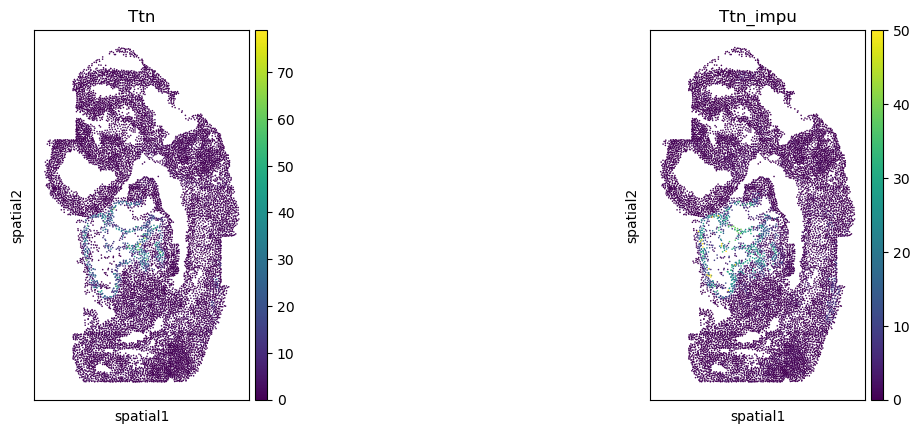

PearsonRResult(statistic=0.697646232689517, pvalue=0.0)
Popdc2


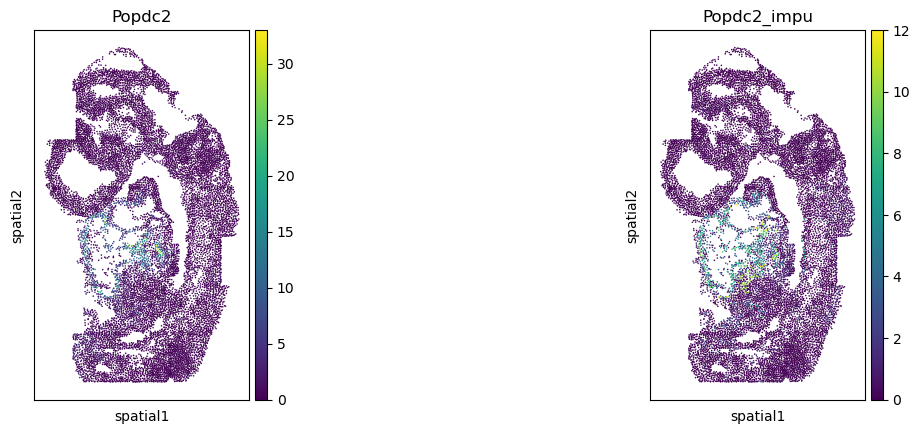

PearsonRResult(statistic=0.49495325628699277, pvalue=0.0)
Six3


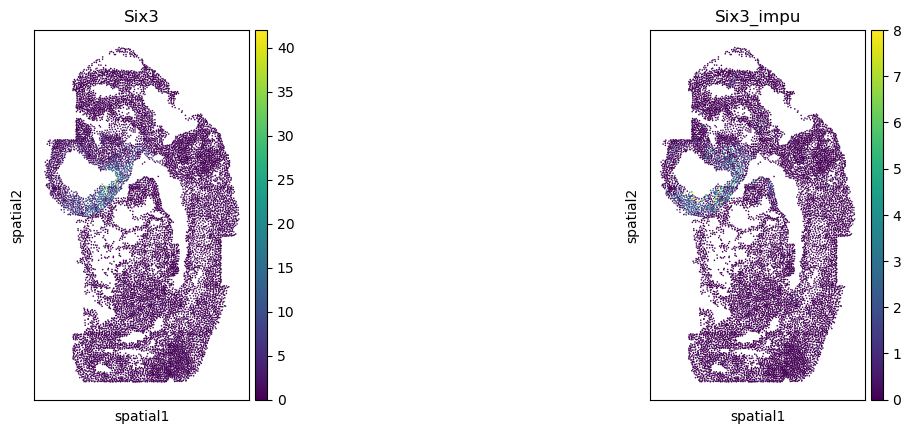

PearsonRResult(statistic=0.45629528085079796, pvalue=0.0)
Lhx2


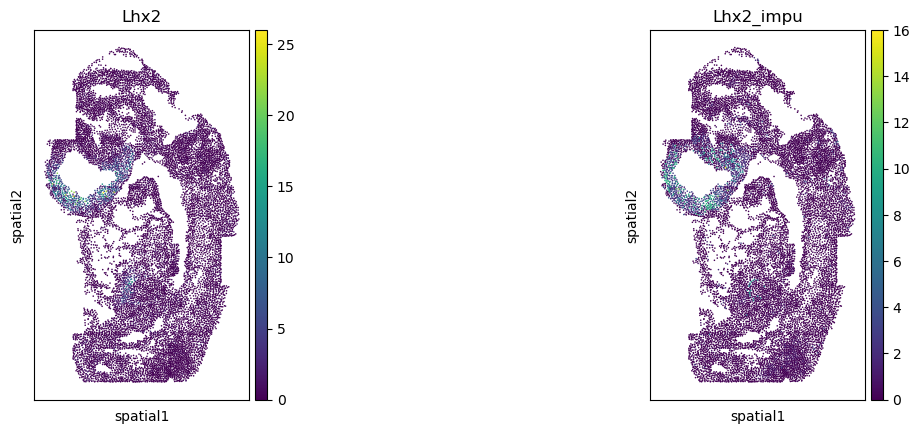

PearsonRResult(statistic=0.40789148889303517, pvalue=0.0)
Foxa1


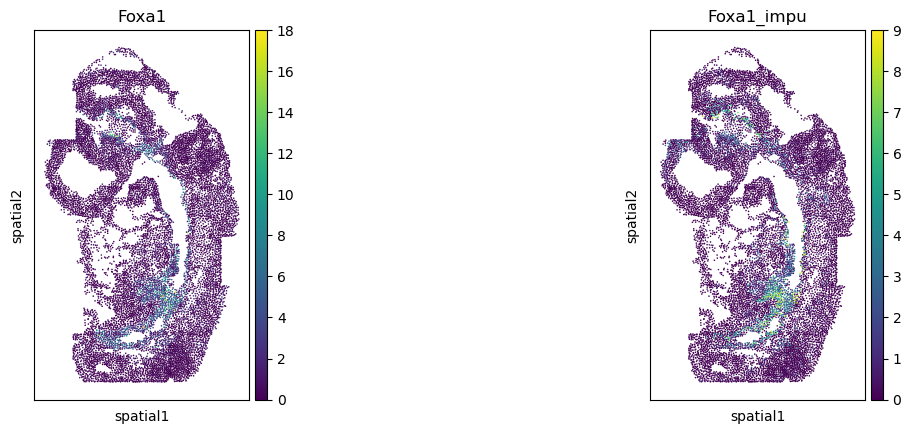

PearsonRResult(statistic=0.40106778982268065, pvalue=0.0)
Cldn4


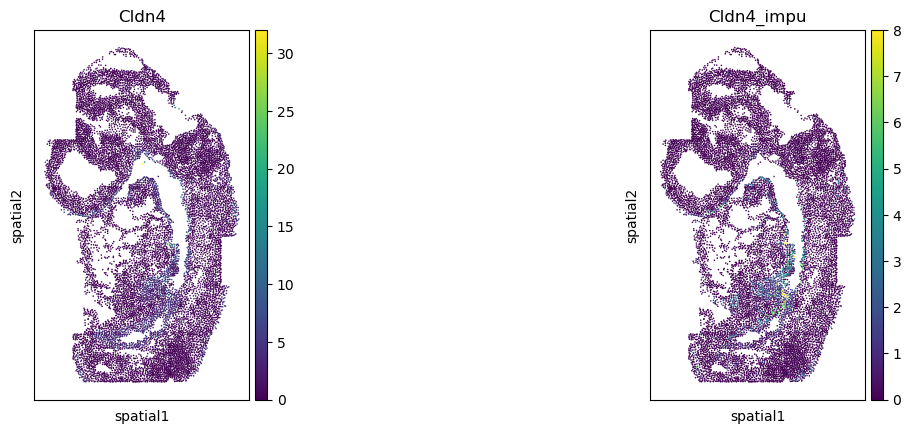

PearsonRResult(statistic=0.3405698050622275, pvalue=0.0)


In [20]:
corr_list = []
for gene in gene_impu_list:
    print(gene)
    gene_val = adata_1[:, [gene]].X.toarray().reshape(-1)[nn_idx]
    adata_0.obs[gene+"_impu"] = gene_val    
    sc.pl.spatial(adata_0, color=[gene, gene+"_impu"], spot_size=1.)
    res = stats.pearsonr(adata_0[:, [gene]].X.toarray().reshape(-1), np.array(adata_0.obs[gene+"_impu"]).reshape(-1))
    print(res)
    corr_list.append(res[0])